### *By Silvia Catalina, curriculum example*

## Import Packages

In [1]:
from IPython.display import Image

# Objective: Using Spark MLib, predict the condition_code for asteroids
The condition code is the orbit uncertainty estimate, with 0 being good and 9 being highly uncertain (NASA)

## Connecting to cluster via command prompt

`ssh maria_dev@127.0.0.1 -p 2222`

## Start Spark shell

`
export SPARK_MAJOR_VERSION=2
spark-shell --master local[*]`

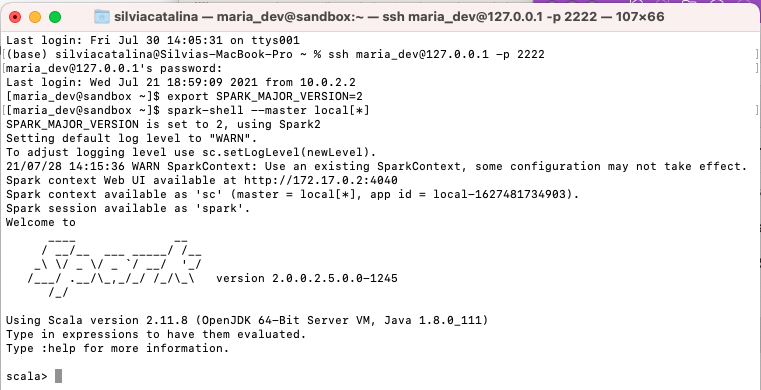

In [2]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_01SparkShell.png')

## Add dataset to Ambari Files view

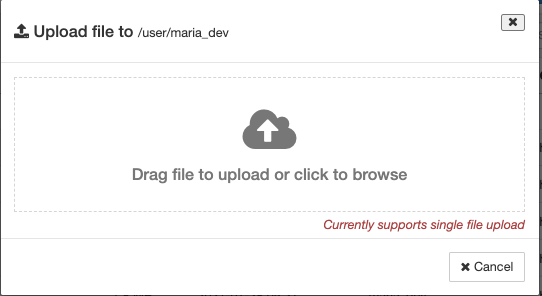

In [3]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_02UploadDataset1.png')

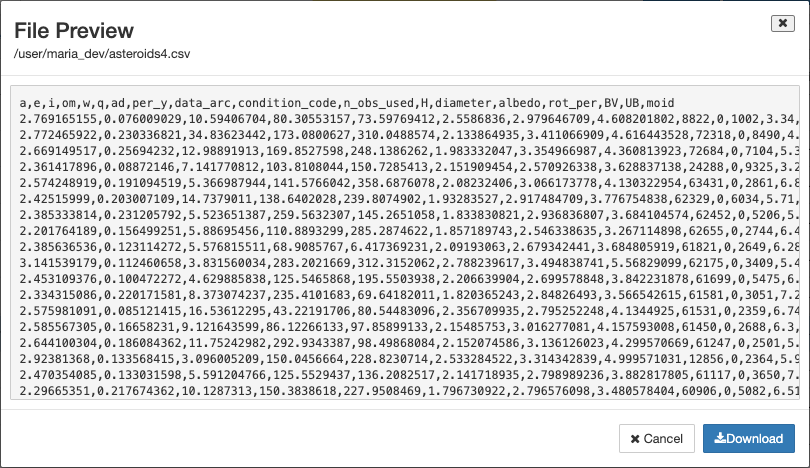

In [4]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_03Asteroid4.png')

## Input data in Spark shell

`val data = spark.read.
option("inferSchema", true).
option("header", true).
csv("hdfs:///user/maria_dev/asteroids4.csv")`

# Data Wrangling

## Dropping columns with missing values (verified in Excel)

`val data0 = data.drop("H", "albedo", "BV", "UB")
data0.show`

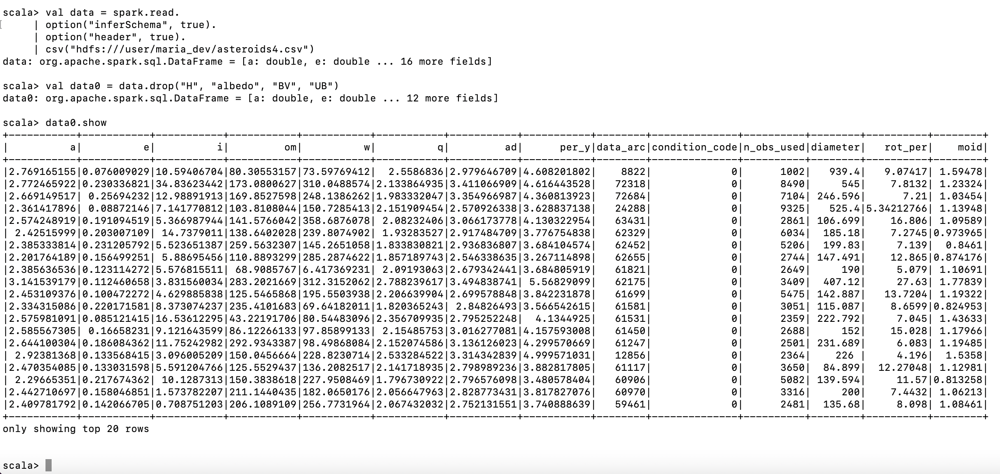

In [5]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_04DataWrangling.png')

## Convert all variables to double

### 1. Check variable types
### 2. Verify condition_code unique values

`data0.printSchema`

`val distinctdf = data0.select(data0("condition_code")).distinct
distinctdf.show`

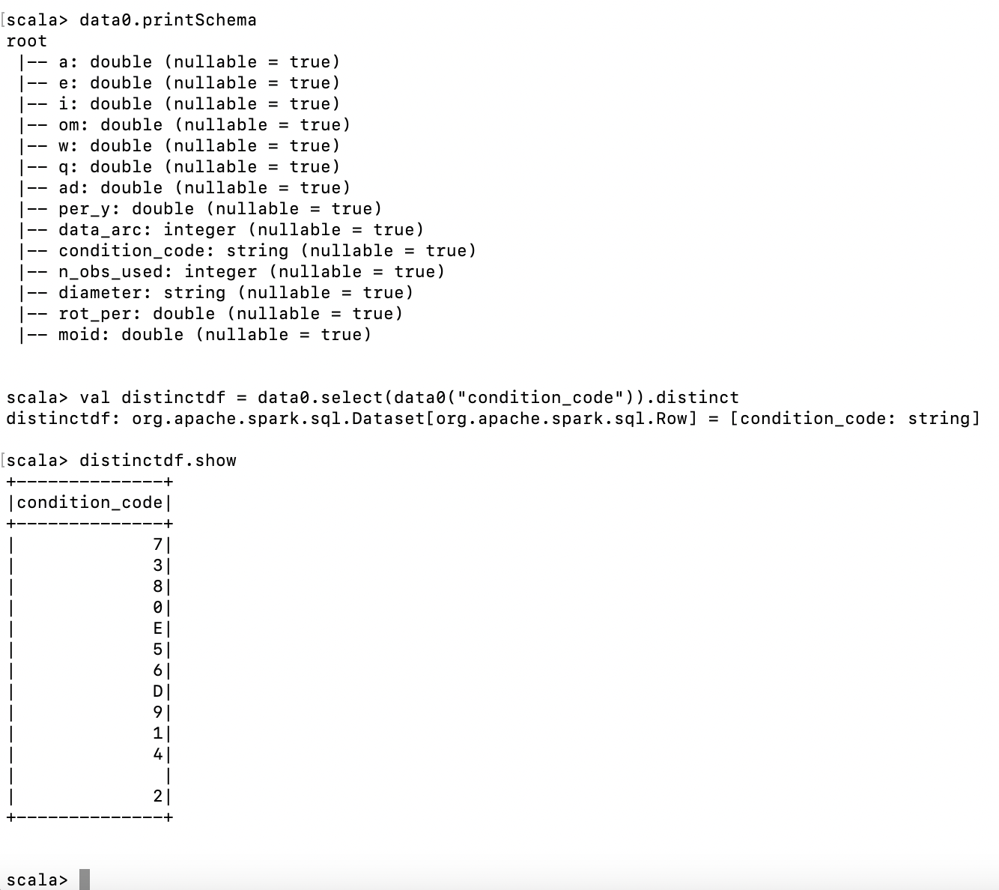

In [6]:
Image(filename ='/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_04VariableDoubles.png')

### 3. Verify condition_code value frequencies

`val frequency = data0.groupBy("condition_code").count.orderBy($"count".desc)
frequency.show`

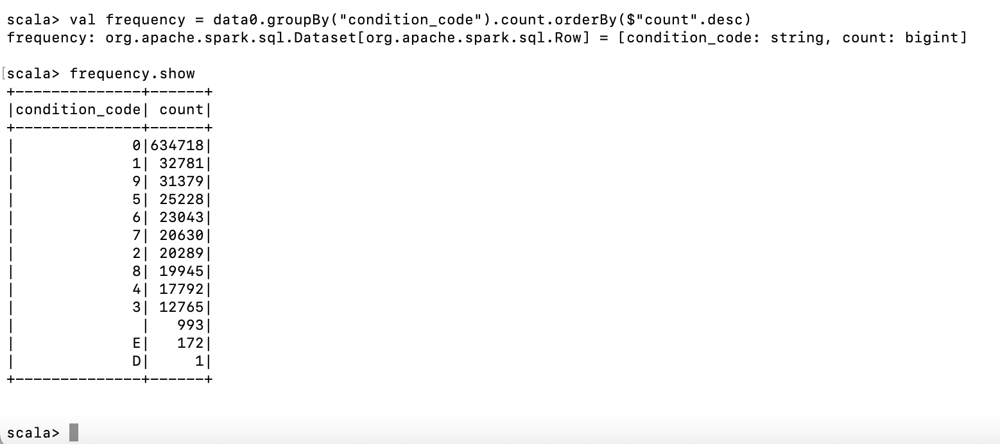

In [7]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_04VariableDoubles1.png')

### 4. Convert variables to double

`val data1 = data0.
withColumn("condition_code", $"condition_code".cast("double")).
withColumn("diameter", $"diameter".cast("double")).
withColumn("data_arc", $"data_arc".cast("double")).
withColumn("n_obs_used", $"n_obs_used".cast("double"))`

`data1.printSchema`

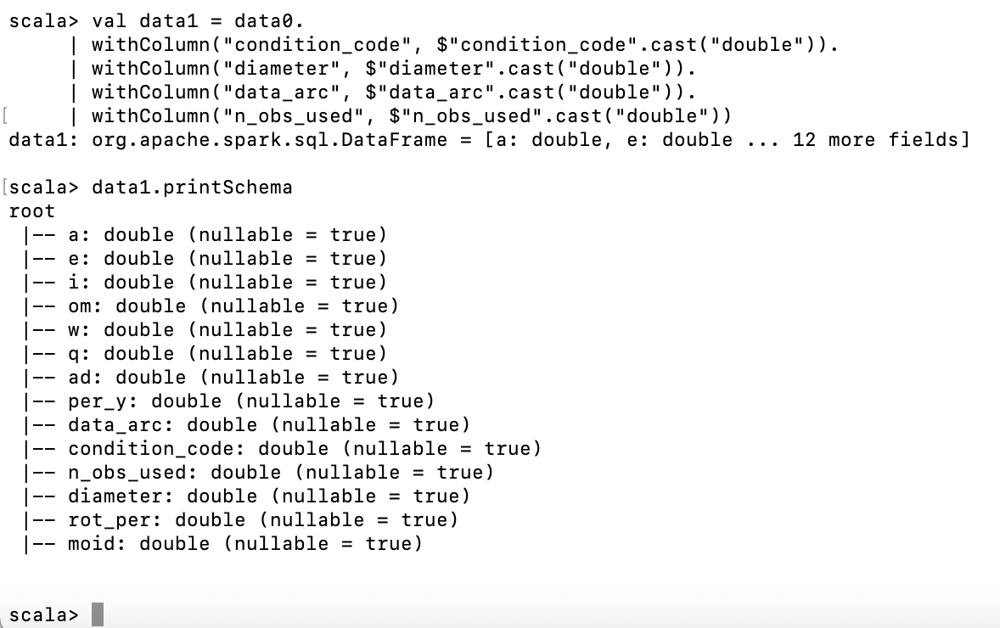

In [8]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_04DataType.png')

# Decision Trees 

## Train Test Split 

`val Array(trainData, testData) = data1.randomSplit(Array(0.9, 0.1))
trainData.cache()
testData.cache()`

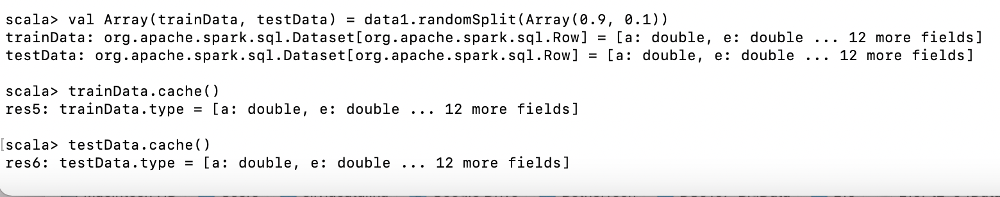

In [9]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_05TrainTestSplit.png')

## Create a feature vector (dropping NAs)

`import org.apache.spark.ml.feature.VectorAssembler
val inputCols = trainData.columns.filter(_ != "condition_code")
val assembler = new VectorAssembler().
setInputCols(inputCols).
setOutputCol("featureVector")
val assembledTrainData = assembler.transform(trainData.na.drop)
assembledTrainData.select("featureVector").show(truncate = false)`

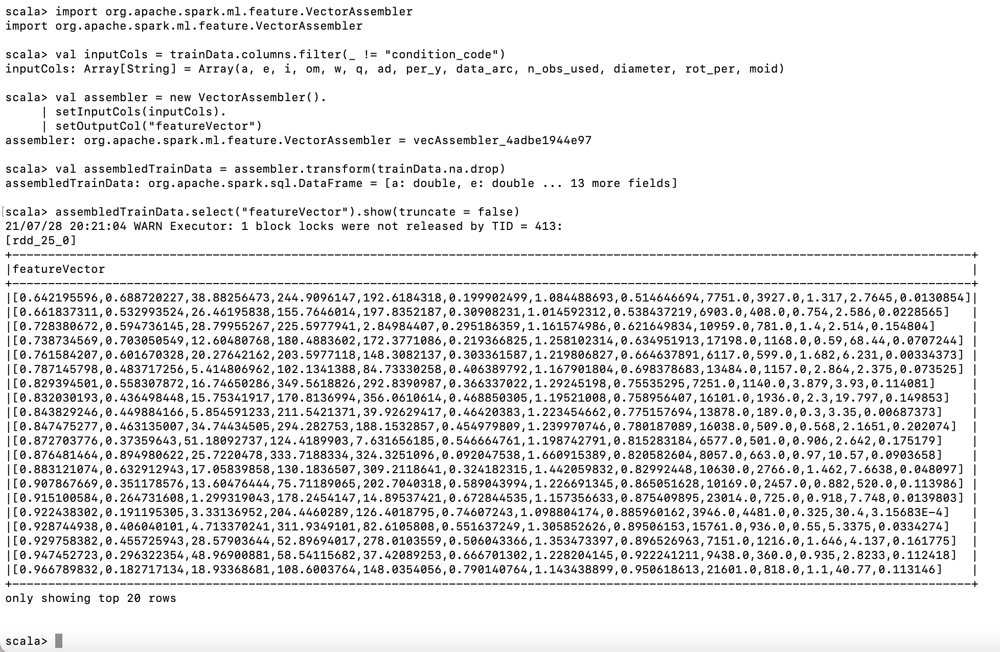

In [10]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_06FeatureVector.png')

## Checking condition_code values included in the dataset when dropping NAs 

`val tData1 = trainData.na.drop
val frequency = tData1.groupBy("condition_code").count.orderBy($"count".desc)
frequency.show`

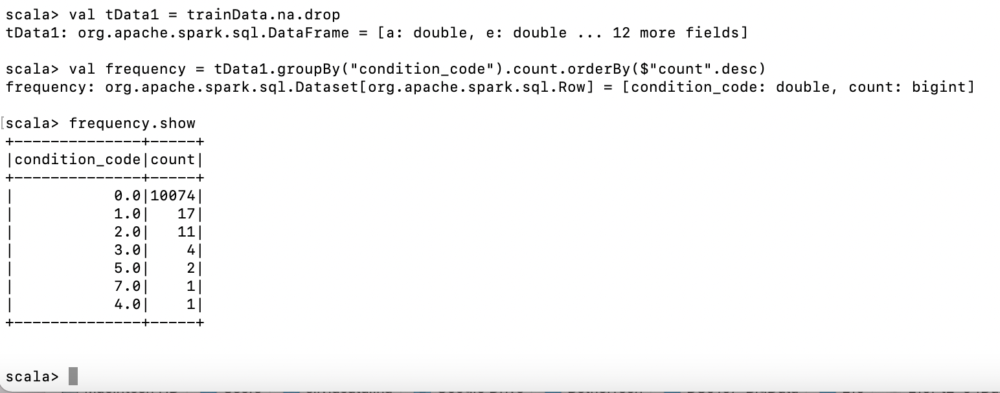

In [12]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_06FeatureVector1.png')

## Decision Tree Classifier 

`import org.apache.spark.ml.classification.DecisionTreeClassifier
import scala.util.Random
val classifier = new DecisionTreeClassifier().
setSeed(Random.nextLong()).
setLabelCol("condition_code").
setFeaturesCol("featureVector").
setPredictionCol("prediction")
val model = classifier.fit(assembledTrainData)
println(model.toDebugString)`

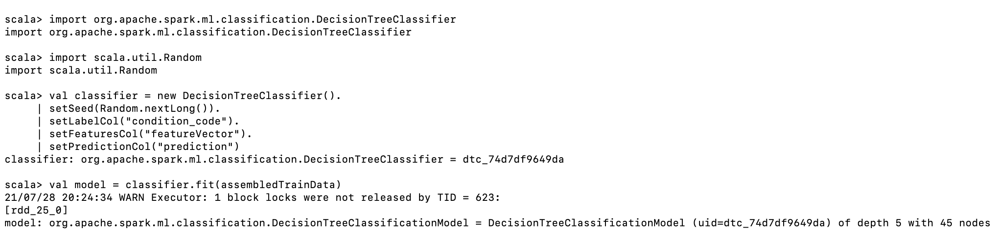

In [13]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_07DecisionTreeClassifier.png')

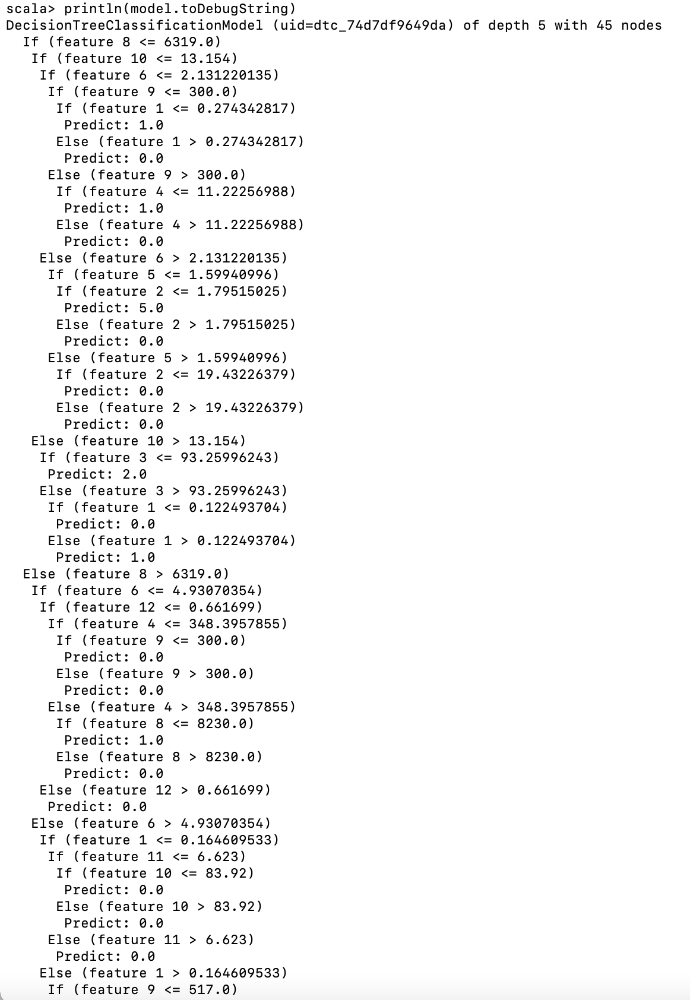

In [14]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_07DecisionTreeClassifier1.png')

## Assess importace of features

`model.featureImportances.toArray.zip(inputCols).
sorted.reverse.foreach(println)`

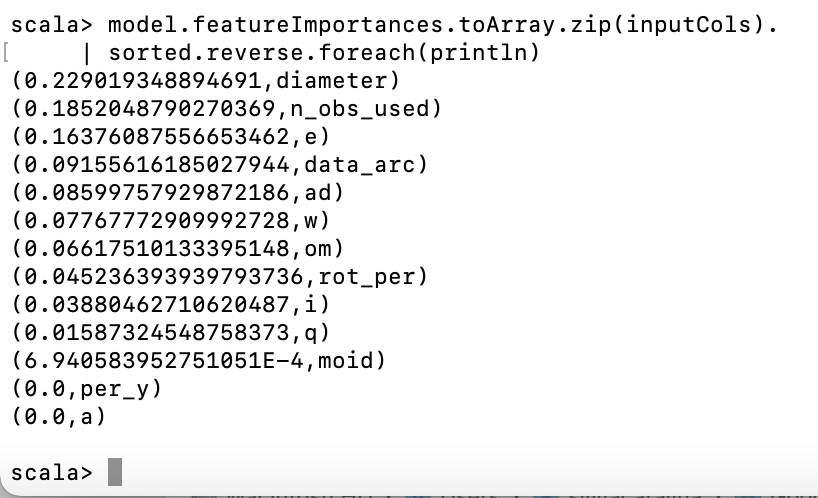

In [15]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_08FeatureImportance.png')

### This tells us that:
* The most important feature in predicting the condition_code is the diameter, followed by n_obs_used, and "e" (eccentricity)
* per_y (orbital period in years) and a (semi-major axis) are the least important features in the predicting the condition_code

## Accuracy of training data

`val predictions = model.transform(assembledTrainData)
predictions.select("condition_code", "prediction", "probability").
show(truncate = false)`

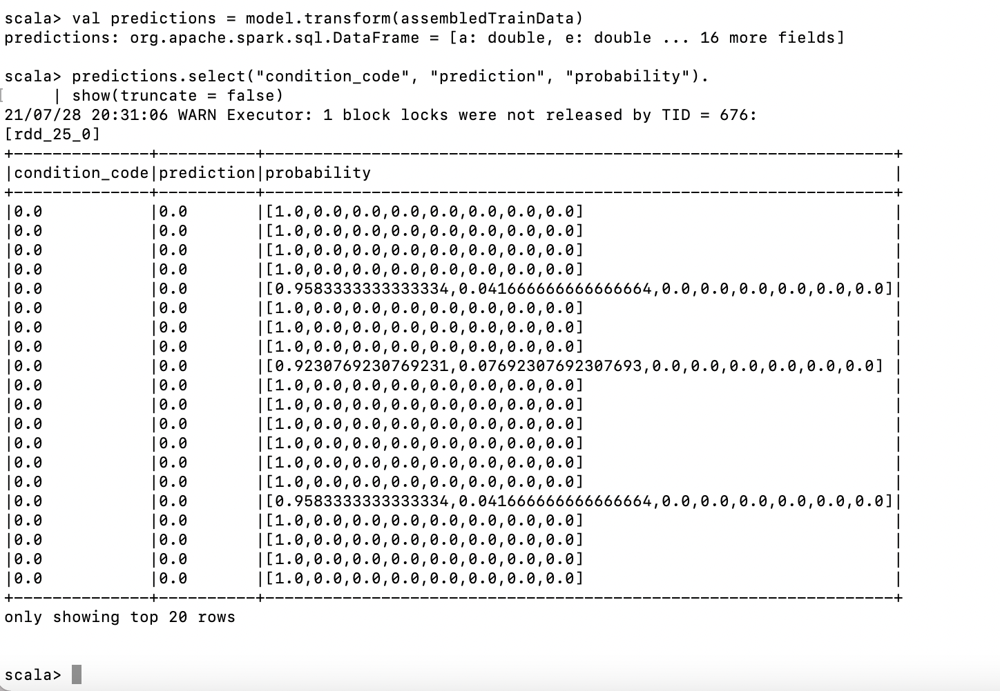

In [16]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_09AccuracyTrainingData.png')

* The top 20 rows show that the prediction was accurate for the condition_code 0 

## Total model accuracy values

`import org.apache.spark.ml.evaluation.MulticlassClassificationEvaluator
val evaluator = new MulticlassClassificationEvaluator().
setLabelCol("condition_code").
setPredictionCol("prediction")
evaluator.setMetricName("accuracy").evaluate(predictions)`

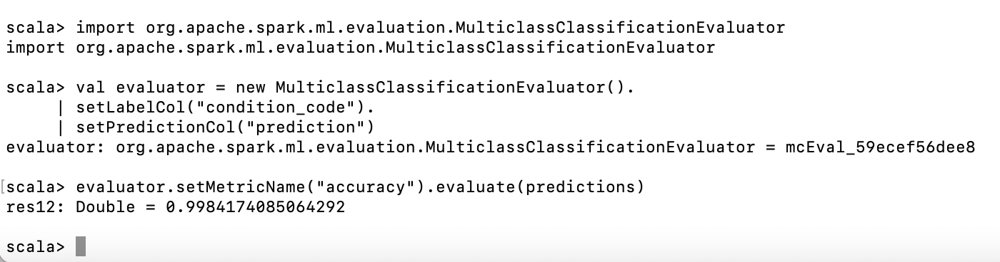

In [17]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_10WholeModelAccuracy.png')

* The model is 99.8 accurate, meaning that it predict the condition code 99.8 % of the time, most likely because the majority of the observations (rows) have a condition_code of 0

## Confusion Matrix

`val confusionMatrix = predictions.
groupBy("condition_code").
pivot("prediction", (0 to 7)).
count().
na.fill(0.0).
orderBy("condition_code")
confusionMatrix.show()`

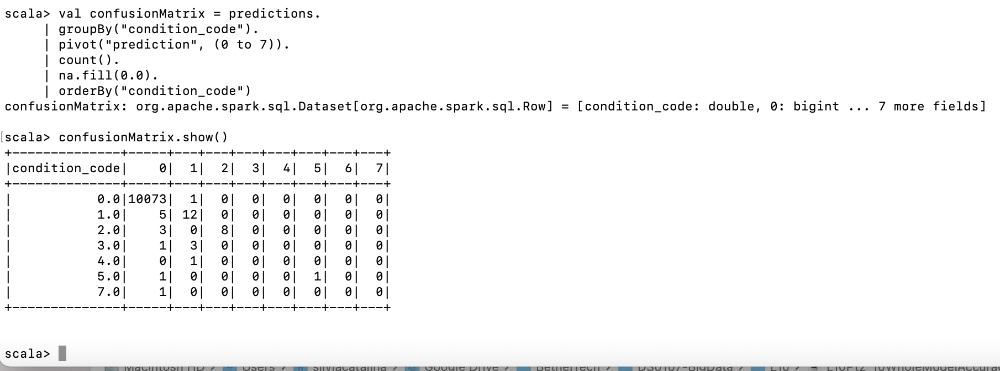

In [18]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_11ConfusionMatrix.png')

## Is the accuracy better than random?

`import org.apache.spark.sql.DataFrame
def classProbabilities(data: DataFrame): Array[Double] = {
val total = data0.count()
data0.groupBy("condition_code").count().
orderBy("condition_code").
select("count").as[Double].
map(_ / total).
collect()
}`

`val trainPriorProbabilities = classProbabilities(trainData)
val testPriorProbabilities = classProbabilities(testData)
trainPriorProbabilities.zip(testPriorProbabilities).map {
case (trainProb, cvProb) => trainProb * cvProb
}.sum`

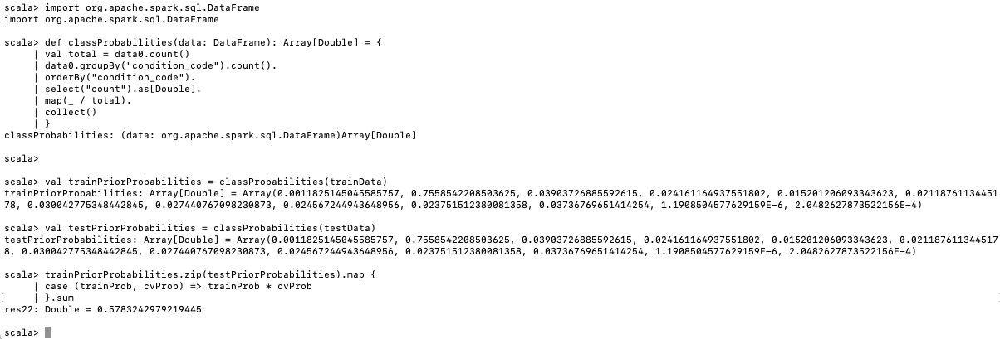

In [26]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_11RandomAccuracy.png')

# Conclusions
* Overall model accuracy is 99.8%
* Random accuracy is 57.8% which is much lower than the model accuracy
* With such high accuracy, hyperparameter tuning isn't necessary, but we proceed for the purposes of completing this exercise

# Hyperparameter Tuning

## Creating a pipeline

`import org.apache.spark.ml.Pipeline
val inputCols = trainData.columns.filter(_ != "condition_code")
val assembler = new VectorAssembler().
setInputCols(inputCols).
setOutputCol("featureVector")
val classifier = new DecisionTreeClassifier().
setSeed(Random.nextLong()).
setLabelCol("condition_code").
setFeaturesCol("featureVector").
setPredictionCol("prediction")
val pipeline = new Pipeline().setStages(Array(assembler, classifier))`

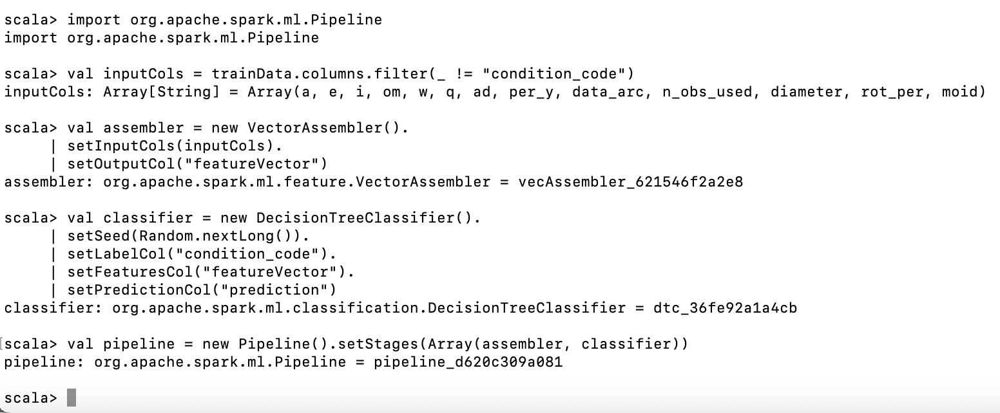

In [19]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_12Pipeline.png')

## Hyperparameter boundaries

`import org.apache.spark.ml.tuning.ParamGridBuilder
val paramGrid = new ParamGridBuilder().
addGrid(classifier.impurity, Seq("gini", "entropy")).
addGrid(classifier.maxDepth, Seq(1, 20)).
addGrid(classifier.maxBins, Seq(40, 300)).
addGrid(classifier.minInfoGain, Seq(0.0, 0.05)).
build()
val multiclassEval = new MulticlassClassificationEvaluator().
setLabelCol("condition_code").
setPredictionCol("prediction").
setMetricName("accuracy")`

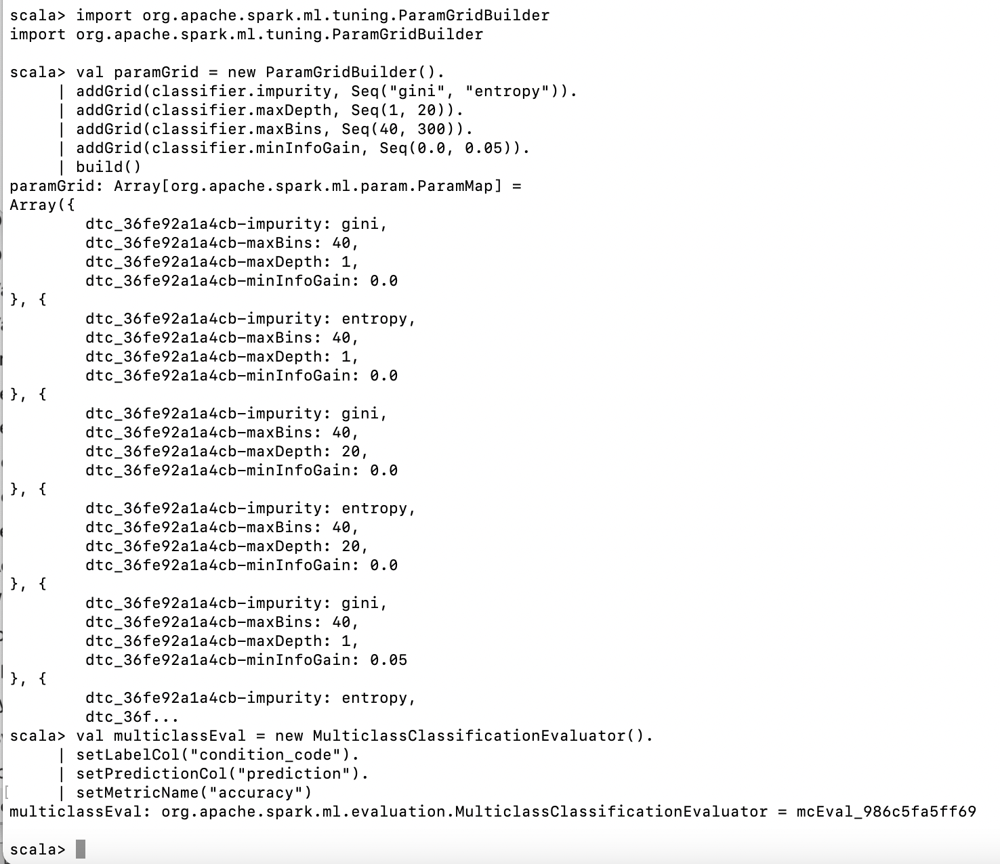

In [20]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_13Hyperparameters.png')

## Train Test Split for Hyperparameter Tuning

`import org.apache.spark.ml.tuning.TrainValidationSplit
val validator = new TrainValidationSplit().
setSeed(Random.nextLong()).
setEstimator(pipeline).
setEvaluator(multiclassEval).
setEstimatorParamMaps(paramGrid).
setTrainRatio(0.9)
val validatorModel = validator.fit(trainData.na.drop)`

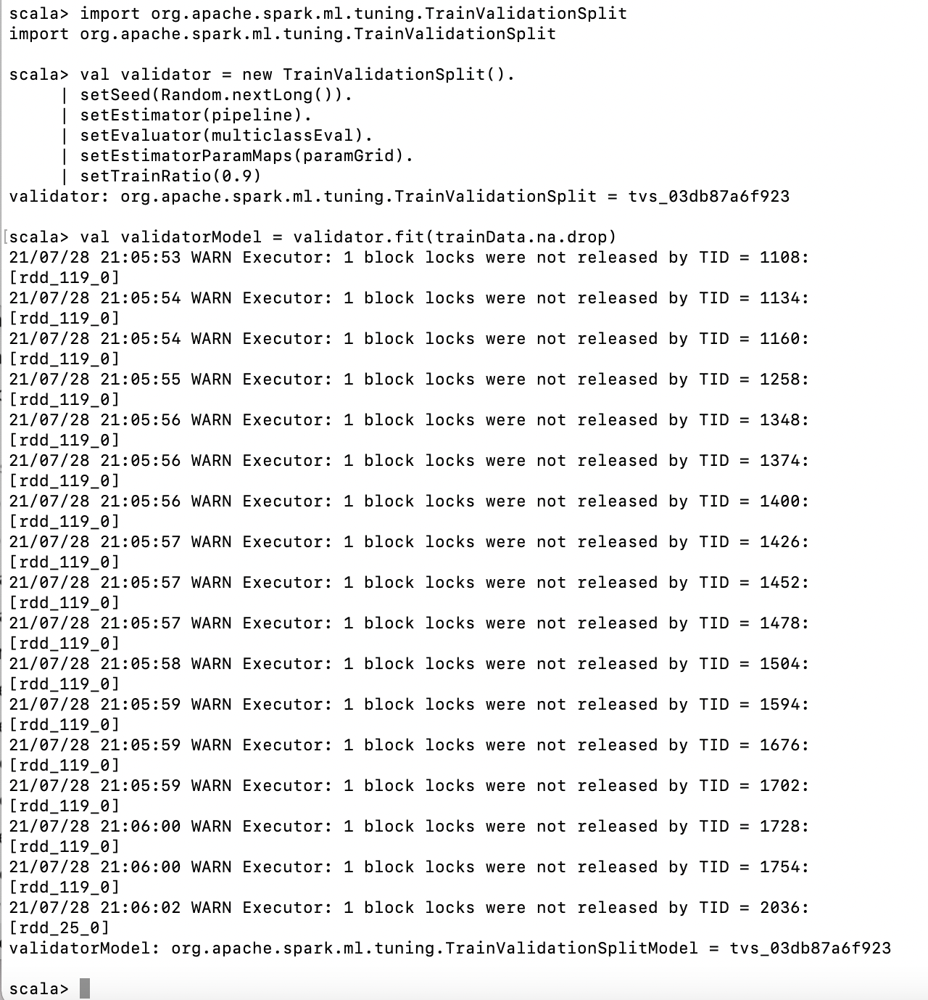

In [21]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_14TrainTestSplitHyper.png')

## Best Fit Model

`import org.apache.spark.ml.PipelineModel
val bestModel = validatorModel.bestModel
bestModel.asInstanceOf[PipelineModel].stages.last.extractParamMap`

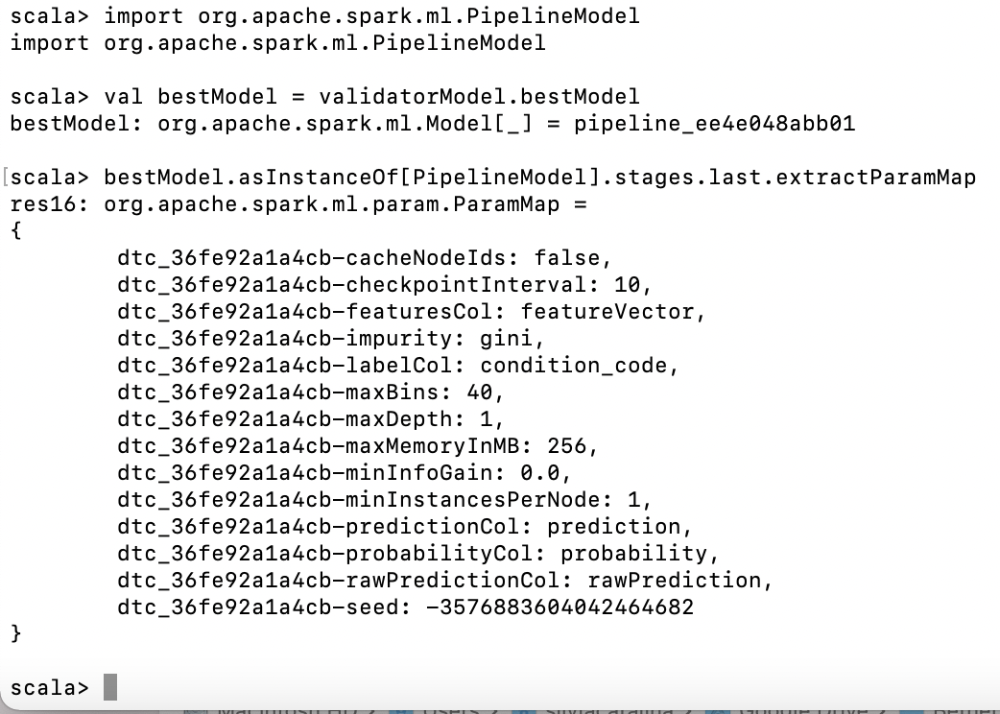

In [22]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_15BestFitModel.png')

### The best fit model uses the gini method of calculating impurity, and has
* 40 maxBins
* maxDepth of 1
* minInfoGain of 0.0

## Accuracy of the models

`val validatorModel = validator.fit(trainData.na.drop)
val paramsAndMetrics = validatorModel.validationMetrics.
zip(validatorModel.getEstimatorParamMaps).sortBy(-_._1)
paramsAndMetrics.foreach { case(metric, params) =>
println(metric)
println(params)
println()
}`

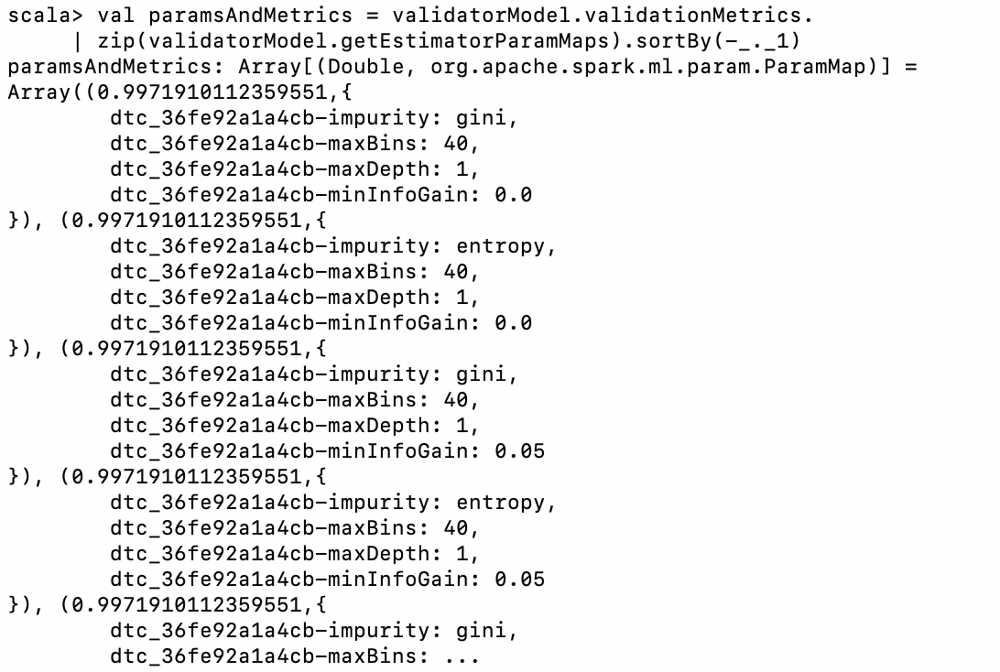

In [23]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_16BestFitModel1.png')

## Using testing data to evaluate the model

`validatorModel.validationMetrics.max
multiclassEval.evaluate(bestModel.transform(testData.na.drop))`

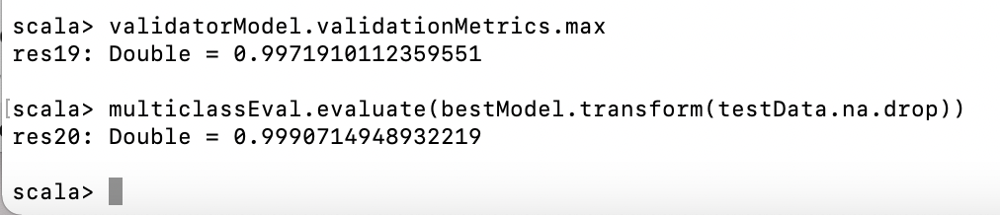

In [25]:
Image(filename = '/Users/silviacatalina/Google Drive/BethelTech/DS0107-BigData/L10/L10Pt2_16BestFitModel2.png')

# Conclusion:
### When using the test data, the hyperparameter tuning model was slightly lower than the overall model by .2%